# Seltion Bias: Two input example

Two input example

In [25]:
from conx import Network
import random

In [26]:
#2-input, 2-hidden, 1-output network
net = Network(2, 2, 1)

rows = 60

In [27]:
def makeTrainData(numRows):
    #TRAIN DATA
    trainfile = open("train.csv", "w")
    #numLines = (int(input('Number of lines of data to generate: ')))
    line = "input1, input2" + "\n"
    trainfile.write(line)
    for i in range(numRows):
        line = str(random.uniform(0, 1)) + ", " + str(random.uniform(0, 1)) + "\n"
        trainfile.write(line)
        print(line)
    trainfile.close()

def makeTestData(numRows, file, x1, y1, x2, y2):
    #TEST DATA
    testfile = open(file, "w")
    line = "input1, input2" + "\n"
    testfile.write(line)
    for i in range(numRows):
        line = str(random.uniform(x1, y1)) + ", " + str(random.uniform(x2, y2)) + "\n"
        testfile.write(line)
        print(line)
    testfile.close()

In [28]:
makeTrainData(rows)

0.1626207715704081, 0.41634657741870884

0.42441044479126533, 0.45743984382399794

0.4334896984634943, 0.07059740308220719

0.34831871852438123, 0.8285993927672215

0.03724128328779819, 0.845584443053997

0.7206330259660896, 0.478948931462869

0.05280847764009078, 0.7302643408521083

0.21976353151535666, 0.4090918065692499

0.4722837093647242, 0.6456810433603396

0.5081948696529146, 0.9561316058767748

0.5020241665918322, 0.07814915983373627

0.9130995467522859, 0.6785366612551147

0.46490997197723327, 0.5082763101838519

0.6310649897279258, 0.9657741134556339

0.7431645983900099, 0.23482142026018027

0.4128685761669928, 0.936885099704883

0.01235447818595159, 0.28498222749706303

0.11706897032513952, 0.6707929165209634

0.04032510323582916, 0.36274136100240073

0.833578946889514, 0.4244127988271066

0.5731936241768102, 0.95323355415497

0.37578854356490776, 0.35432164904290353

0.019965409164163006, 0.1603485542989047

0.384920975109748, 0.9910809709329221

0.9378123601085343, 0.06535

In [29]:
makeTestData(rows, "test1.csv", .5, .6, .2, .3)

0.548157384794916, 0.2036804018480512

0.5490528184635916, 0.29284171424895733

0.582501664280312, 0.2657384320434783

0.5849904616786573, 0.28653107735180866

0.5165858680427683, 0.26980521216008607

0.5864405013691044, 0.2160186471363215

0.5569784382991118, 0.2611383340147823

0.511530032770615, 0.20247799192575103

0.5076737033761151, 0.24694421269438732

0.55668771940555, 0.2311922446288168

0.5834592719898506, 0.21445875212947274

0.5503137071454557, 0.20825803255205963

0.5790174899234819, 0.253046488903865

0.5903151215057476, 0.21337494822038616

0.5182536928157743, 0.24392714190962275

0.5273825837627266, 0.24207745600805491

0.5405969102721264, 0.27829793456695495

0.5268580178920396, 0.2830897556487497

0.5034384628489037, 0.22173730228812558

0.5687079098875577, 0.24147399855238974

0.5378437358610831, 0.25688783658908954

0.5382741390973933, 0.21774347911821465

0.5381830310717057, 0.219439596145755

0.5354262516448931, 0.201336093184625

0.5168963170257791, 0.25696785314

In [30]:
makeTestData(rows, "test2.csv", .1, .2, .7, .8)

0.16025826876018118, 0.7366046991655516

0.11661927454574562, 0.7848340706844946

0.1859460349414504, 0.7716717250432399

0.13237722839301935, 0.7790595705078488

0.18104771160903044, 0.7463996072288419

0.17631728633624644, 0.7590974619000419

0.1893321827669, 0.7200007617308756

0.18731832293695966, 0.7632696871911189

0.15485866100191567, 0.765917007623923

0.19190477868938666, 0.7594069731137132

0.1406180360111342, 0.7122211016369357

0.13196183072926157, 0.7181649945815481

0.11146488578946295, 0.7790660818100863

0.15757091430909953, 0.7529121198547898

0.16685348030476327, 0.7344145370115331

0.12913940850315633, 0.7267222414654553

0.17732940103011438, 0.7535702759829823

0.15570171443154476, 0.7303180270055436

0.1081141052203318, 0.7863599461491799

0.1130191253414462, 0.7406907990320679

0.18087266280625058, 0.7090994313550006

0.17746017138512502, 0.7525318871418568

0.13308078389289682, 0.721695845249051

0.11564285516344441, 0.7500398992672607

0.12957178797819374, 0.775

In [31]:
#Unwieghted data - To train network on 
def getData(numRows, file):
    tf = open(file, "r")
    content = tf.readlines()
    #Parse file
    input = []
    content = [x.strip() for x in content[1:]] 
    for y in content:
        row = [float(col) for col in y.split(", ")]
        #print(row)
        input.append(row)
    tf.close()
    return input
    
inputs = getData(rows, "train.csv")

In [32]:
def countFalse(inputs):
    count = 0
    for r in inputs:
        if((r[0] + r[1]) < 1):
            #1 top half
            count += 1
    return count
        #else: 
            #0 bottom half
            # false result

In [33]:
falseCountTrainData = countFalse(inputs)
print(falseCountTrainData)

34


In [34]:
#desired output/target
def des(inputs):
    one = inputs[0]
    two = inputs[1]
    print(two)
    if((one + two) > 1):
        #1 top half
        return [int(1)]
    else: 
        #0 bottom half
        return [int(0)]
# set inputs and desired output 

net.set_target_function(des)


In [35]:
net.set_inputs(inputs)

In [36]:
net.train()

--------------------------------------------------
Training for max trails: 5000 ...
0.4090918065692499
0.936885099704883
0.36274136100240073
0.9202915856846863
0.20417960966697168
0.478948931462869
0.8647359810293466
0.6440516800317068
0.8195335288233349
0.35432164904290353
0.2633903480073474
0.03228051467445092
0.12291599078399695
0.9910809709329221
0.9273240298363069
0.6865645202809411
0.3713517763937815
0.5082763101838519
0.2826776918295265
0.9803849904641687
0.11471033078868154
0.45743984382399794
0.41945003051933605
0.17231825389407762
0.43072863436082187
0.14086507651864932
0.18892940462908403
0.7765844620745671
0.9657741134556339
0.6707929165209634
0.5857324216118598
0.6456810433603396
0.6785366612551147
0.17628960749034883
0.23482142026018027
0.7906225178426103
0.00441293598952619
0.1898412870481564
0.8625190564181793
0.47471638580211306
0.1603485542989047
0.4244127988271066
0.7302643408521083
0.95323355415497
0.8931850997239215
0.9561316058767748
0.4427155429427744
0.60494583

In [37]:
#try network on test data
def getResults(numInputs, file):
    inputs = getData(numInputs, file)
    results = []
    for i in inputs:
        results.append(net.propagate(i))
    return results

In [38]:
results1 = getResults(rows, "test1.csv")

In [39]:
results2 = getResults(rows, "test2.csv")

In [40]:
arrayResults = []
arrayResults.append(results1)
arrayResults.append(results2)

In [41]:
def getBias(res, falseTrain, lenTrain):
    resFalseCount = 0
    
    #total falses from test dataset of interest
    for i in res:
        if i < .5:
            resFalseCount += 1
    
    numer = resFalseCount/len(res)
    demo = falseTrain/lenTrain
    
    print(numer)
    print(demo)
    return numer/demo

#((test data of interest), (arrayOfTest))
print(getBias(results1, falseCountTrainData, rows))     

1.0
0.5666666666666667
1.7647058823529411


In [42]:
print(getBias(results2, falseCountTrainData, rows))  

1.0
0.5666666666666667
1.7647058823529411


In [43]:
net.test()

--------------------------------------------------
Test:
0.1603485542989047
******************************
Input : [0.019965409164163006, 0.1603485542989047]
Output: [  4.90322073e-07] 
Target: [0] Correct
0.478948931462869
******************************
Input : [0.7206330259660896, 0.478948931462869]
Output: [ 0.99990738] 
Target: [1] Correct
0.00441293598952619
******************************
Input : [0.23110997781826814, 0.00441293598952619]
Output: [  5.97860796e-07] 
Target: [0] Correct
0.28498222749706303
******************************
Input : [0.01235447818595159, 0.28498222749706303]
Output: [  6.90508982e-07] 
Target: [0] Correct
0.6865645202809411
******************************
Input : [0.7428960472047689, 0.6865645202809411]
Output: [ 0.99997467] 
Target: [1] Correct
0.17231825389407762
******************************
Input : [0.9990070340070499, 0.17231825389407762]
Output: [ 0.9998973] 
Target: [1] Correct
0.9273240298363069
******************************
Input : [0.01058599

In [44]:
net.reset()

In [45]:
net.train()

--------------------------------------------------
Training for max trails: 5000 ...
0.6707929165209634
0.41634657741870884
0.6440516800317068
0.95323355415497
0.28498222749706303
0.1603485542989047
0.9048987426140138
0.03228051467445092
0.6785366612551147
0.07059740308220719
0.7765844620745671
0.07814915983373627
0.6865645202809411
0.478948931462869
0.845584443053997
0.41945003051933605
0.6456810433603396
0.6049458344587186
0.9561316058767748
0.17628960749034883
0.9657741134556339
0.45743984382399794
0.936885099704883
0.1898412870481564
0.9792328230530243
0.2633903480073474
0.47471638580211306
0.36274136100240073
0.9910809709329221
0.00441293598952619
0.17231825389407762
0.5857324216118598
0.4427155429427744
0.23482142026018027
0.9803849904641687
0.4090918065692499
0.8647359810293466
0.21315110027703377
0.20417960966697168
0.35432164904290353
0.43072863436082187
0.8285993927672215
0.18892940462908403
0.7302643408521083
0.12291599078399695
0.3713517763937815
0.8195335288233349
0.508276

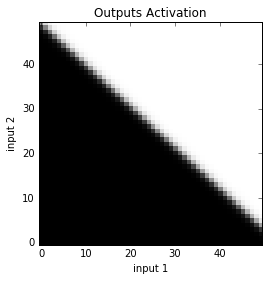

In [47]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

res = 50 # resolution
z = np.zeros((res, res))

for x in range(res):
    for y in range(res):
        z[x][y] = net.propagate([x/res, y/res])

plt.imshow(z, cmap=plt.cm.gray, interpolation='nearest', origin="lower")
plt.xlabel("input 1")
plt.ylabel("input 2")
plt.title("Outputs Activation")

In [48]:
net.reset()
net.train(max_training_epochs=1000, momentum=0.8, epsilon=.1)
net.test()

--------------------------------------------------
Training for max trails: 1000 ...
0.20417960966697168
0.35432164904290353
0.9561316058767748
0.1603485542989047
0.8931850997239215
0.8647359810293466
0.37391948855319335
0.4244127988271066
0.1898412870481564
0.6785366612551147
0.41634657741870884
0.23482142026018027
0.6865645202809411
0.17628960749034883
0.4090918065692499
0.26383291851051927
0.9792328230530243
0.9657741134556339
0.18892940462908403
0.2633903480073474
0.36274136100240073
0.6707929165209634
0.5082763101838519
0.6456810433603396
0.478948931462869
0.6440516800317068
0.8285993927672215
0.14086507651864932
0.7302643408521083
0.4427155429427744
0.9202915856846863
0.9910809709329221
0.2826776918295265
0.12291599078399695
0.9803849904641687
0.8625190564181793
0.00441293598952619
0.06535330837066888
0.11471033078868154
0.7765844620745671
0.45743984382399794
0.17231825389407762
0.07814915983373627
0.8195335288233349
0.936885099704883
0.03228051467445092
0.43072863436082187
0.904